In [1]:
import glob, os
import pathlib
import json
import yaml

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import collections
from pprint import pprint


# parallel
from dask import dataframe as dd
import modin.pandas as pdm


%matplotlib inline

In [2]:
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report

# saving the ML model to pickle file and load it
import pickle

In [3]:
# avoid the module's method call deprecation
try:
    collectionsAbc = collections.abc
except AttributeError:
    collectionsAbc = collections

Configuring Juputer's options to present more things to the output.

In [4]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', None)

# Dashboard client for resources monitoring

In [5]:
from dask.distributed import Client, progress
client = Client(threads_per_worker=4, n_workers=1)
client

Perhaps you already have a cluster running?
Hosting the HTTP server on port 53680 instead


Client Scheduler: tcp://127.0.0.1:53681 Dashboard: http://127.0.0.1:53680/status,Cluster Workers: 1 Cores: 4 Memory: 17.18 GB


# Check the number of cores in the CPU

In [6]:
import multiprocessing
multiprocessing.cpu_count()

8

# Functions to use

## Function to fully flatten each json file

In [7]:
def flatten_dict_full(d, sep="_"):
    obj = collections.OrderedDict()

    def recurse(t, parent_key=""):
        
        if isinstance(t, list):
            for i in range(len(t)):
                recurse(t[i], parent_key + sep + str(i) if parent_key else str(i))
        elif isinstance(t,dict):
            for k, v in t.items():
                recurse(v, parent_key + sep + k if parent_key else k)
        else:
            obj[parent_key] = t
    recurse(d)

    return obj

In [8]:
import dask

In [9]:
flatten_dict_full = dask.delayed(flatten_dict_full)

# Load Data GroundTruth

## Path declaration

In [10]:
path_obj = pathlib.Path().absolute()

In [11]:
path_app = path_obj.as_posix()
# print('Current path:', path_app)
print('Type:', type(path_app))

Type: <class 'str'>


In [12]:
path_app = os.path.join(os.path.abspath(os.getcwd()), os.pardir)
# path = os.path.join(path, 'danceability', 'features', 'mp3')
print('Current path:', path_app)
print('Type:', type(path_app))

Current path: /Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/..
Type: <class 'str'>


## Count all the JSON data included in files

In [13]:
counter = 0
for root, dirs, files in os.walk(path_app):
    for file in files:
        if file.endswith(".json"):
#             print(os.path.join(root, file))
            counter += 1
            
print('counted json files:', counter)

counted json files: 10461


## Load the GroundTruth file

In [14]:
with open(os.path.join(path_app, 'acousticbrainz-datasets/danceability/metadata/groundtruth.yaml'), 'r') as stream:
    try:
        groundTr_data = yaml.safe_load(stream)
    except yaml.YAMLError as exc:
        print(exc)

In [15]:
# pprint(groundTr_data)

In [16]:
# pprint(groundTr_data['groundTruth'])

In [17]:
len(groundTr_data['groundTruth'].keys())

225

## Check the unique folders with tracks and sort them alphabetically

In [18]:
labeled_tracks = groundTr_data['groundTruth']

### Split the keys in Folder - Track Name

In [19]:
folders = []
for key in labeled_tracks:
    key = key.split('/')
    folders.append(key[0])

In [20]:
print(folders[:15])

['Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Alternative', 'Blues', 'Blues', 'Blues', 'Blues', 'Blues', 'Blues']


### Check the folders

In [21]:
folders = set(folders)
folders = list(folders)
folders.sort()
folders

['Alternative',
 'Blues',
 'Classical',
 'Country',
 'Dance and House',
 'Folk and New Age',
 'Hip-Hop and Rap',
 'House & Garage and Grime',
 'Jazz',
 'Jungle and D&B',
 'Latin',
 'Pop',
 'R&B and Soul',
 'Reggae',
 'Rock and Metal',
 'Techno and Electro',
 'Vocal and Acapella']

## Class Name retrieved from GT file

In [22]:
class_name = groundTr_data['className']

In [23]:
class_name

'danceability'

# Load a DF containing all the tracks (features + GT data)

In [24]:
path_features = os.path.join(path_app, 'acousticbrainz-datasets', 'danceability', 'features')
low_level_dir = ''
if len(os.listdir(path_features)) == 0:
    print("Directory is empty")
else:
    print("Directory is not empty")
    directory_contents = os.listdir(path_features)
    if 'mp3' in directory_contents:
        low_level_dir = 'mp3'
    elif 'orig' in directory_contents:
        low_level_dir = 'orig'
    else:
        low_level_dir = ''
        print('There is no valid low-level data inside the features directory')
print('Low-level directory:', low_level_dir)

Directory is not empty
Low-level directory: mp3


In [25]:
path_low_level = os.path.join(path_app, 'acousticbrainz-datasets/danceability', 'features', low_level_dir)

In [26]:
# path_low_level

In [27]:
if low_level_dir != '':
    tracks = []
    for key, value in labeled_tracks.items():
        track_dict = {}
        key = key.split('/')
        path_tracks = os.path.join(path_low_level, key[0])
        for f_name in os.listdir(path_tracks):
            if f_name.startswith(key[1]):
                track_dict['json_directory'] = key[0]
                track_dict['track'] = key[1]
                track_dict['track_path'] = os.path.join(path_low_level, key[0], f_name)
                track_dict['danceability'] = value
        tracks.append(track_dict)

In [28]:
# pprint(tracks)

In [29]:
len(tracks)

225

In [30]:
type(tracks)

list

### Different DFs loading using Pandas, Modin, Dask

In [31]:
df_tracks = pd.DataFrame(data=tracks)

Plot the track's paths

In [32]:
df_tracks.head()

,json_directory,track,track_path,danceability
0,Alternative,02 Happy Birthday - Altered Images.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/02 Happy Birthday - Altered Images.mp3.json,danceable
1,Alternative,03 How Soon Is Now - Smiths.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/03 How Soon Is Now - Smiths.mp3.json,not_danceable
2,Alternative,04 Pearly Dewdrops' Drops - Cocteau Twins.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/04 Pearly Dewdrops' Drops - Cocteau Twins.mp3.json,not_danceable
3,Alternative,06 Mr Brightside - Killers.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Mr Brightside - Killers.mp3.json,danceable
4,Alternative,06 Song 2 - Blur.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Song 2 - Blur.mp3.json,danceable


Check the className distribution of the data based on the 'genre_category'

In [33]:
mdf_tracks = pdm.DataFrame(data=tracks)

In [34]:
type(mdf_tracks)

modin.pandas.dataframe.DataFrame

In [35]:
import dask.dataframe as dd
import pandas as pd

In [36]:
ddf_tracks = dd.from_pandas(pd.DataFrame(data=tracks), npartitions=20)

In [37]:
ddf_tracks.head()

,json_directory,track,track_path,danceability
0,Alternative,02 Happy Birthday - Altered Images.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/02 Happy Birthday - Altered Images.mp3.json,danceable
1,Alternative,03 How Soon Is Now - Smiths.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/03 How Soon Is Now - Smiths.mp3.json,not_danceable
2,Alternative,04 Pearly Dewdrops' Drops - Cocteau Twins.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/04 Pearly Dewdrops' Drops - Cocteau Twins.mp3.json,not_danceable
3,Alternative,06 Mr Brightside - Killers.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Mr Brightside - Killers.mp3.json,danceable
4,Alternative,06 Song 2 - Blur.mp3,/Users/pantelistzamalis/Desktop/google2020/gsoc_ml_infrastructure/notebooks/../acousticbrainz-datasets/danceability/features/mp3/Alternative/06 Song 2 - Blur.mp3.json,danceable


In [38]:
type(ddf_tracks)

dask.dataframe.core.DataFrame

Data distribution based on the genres

In [39]:
df_tracks['json_directory'].value_counts()

Latin                       22
Jungle and D&B              22
Dance and House             21
Hip-Hop and Rap             19
Vocal and Acapella          17
Techno and Electro          16
Folk and New Age            16
Rock and Metal              13
R&B and Soul                13
Reggae                      12
House & Garage and Grime    10
Alternative                  9
Blues                        8
Country                      8
Pop                          7
Classical                    6
Jazz                         6
Name: json_directory, dtype: int64

In [40]:
mdf_tracks['json_directory'].value_counts()

To request implementation, send an email to feature_requests@modin.org.


Latin                       22
Jungle and D&B              22
Dance and House             21
Hip-Hop and Rap             19
Vocal and Acapella          17
Techno and Electro          16
Folk and New Age            16
Rock and Metal              13
R&B and Soul                13
Reggae                      12
House & Garage and Grime    10
Alternative                  9
Blues                        8
Country                      8
Pop                          7
Classical                    6
Jazz                         6
dtype: int64

In [42]:
# ddf_tracks.

# Features DF

## Clean the low-level from the unnecessary features and load the rest to a list

Each index/item of the list contains the cleaned dictionary low-level data, flattened by the relevant function

In [43]:
list_feats_tracks = []

In [44]:
list_feats_tracks.clear()  # clear the list if it not empty

counter_items_transformed = 0
for index, row in df_tracks.iterrows():
    f = open(row['track_path'])
    data_feats_item = json.load(f)

    # remove unnecessary data
    if 'metadata' in data_feats_item:
      del data_feats_item['metadata']
    if 'beats_position' in data_feats_item['rhythm']:
      del data_feats_item['rhythm']['beats_position']
    
    # data dictionary transformed to a fully flattened dictionary
    data_feats_item = flatten_dict_full(data_feats_item).compute()

    # append to a full tracks features pandas df
    list_feats_tracks.append(dict(data_feats_item))
    
    counter_items_transformed += 1

print('Items parsed and transformed:', counter_items_transformed)

Items parsed and transformed: 225


In [32]:
len(list_feats_tracks)

225

In [ ]:
type(l)

In [33]:
# list_feats_tracks

## Check a flattened low-level instance and save a sample locally

In [34]:
type(list_feats_tracks[0])

dict

In [35]:
example_dict = list_feats_tracks[0]

In [36]:
df_sample = pd.DataFrame.from_dict(example_dict, orient='index', columns=['low_level_data'])

In [37]:
df_sample.reset_index(level=0, inplace=True)

In [38]:
df_sample.columns = ['low_level_data', 'low_level_values']
df_sample.head()

,low_level_data,low_level_values
0,lowlevel_average_loudness,0.940232
1,lowlevel_barkbands_crest_dmean,2.76666
2,lowlevel_barkbands_crest_dmean2,4.4483
3,lowlevel_barkbands_crest_dvar,5.74581
4,lowlevel_barkbands_crest_dvar2,14.9876


In [39]:
df_sample.to_csv('sample_flattened_low_level_data.csv')

## Transform the low-level features instances to DF

In [40]:
df_feats_tracks = pd.DataFrame(list_feats_tracks, columns=list_feats_tracks[0].keys())

In [41]:
df_feats_tracks.head()

lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0                   0.940232                        2.766660   
1                   0.918468                        2.675291   
2                   0.903639                        2.680212   
3                   0.964146                        2.334805   
4                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.126804                               0.123771   
3                             0.096527                               0.074531   
4                             0.115602                               0.095726   

   lowlevel_barkbands_flatness_db_min  lowlevel_barkbands_flatness_db_var  \
0                            0.040839                            0.010974   
1                            0.025457                            0.001940   
2                            0.045240                  

In [42]:
df_feats_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Columns: 2651 entries, lowlevel_average_loudness to tonal_key_scale
dtypes: float64(2573), int64(74), object(4)
memory usage: 4.6+ MB


In [43]:
df_feats_tracks.shape

(225, 2651)

## Concatenate the tracks DF with the feats DF

In [44]:
df_tracks.columns

Index(['json_directory', 'track', 'track_path', 'danceability'], dtype='object')

In [45]:
df_tracks.drop(labels=['track_path'], axis=1, inplace=True)

In [46]:
df_full_tracks = pd.concat([df_tracks, df_feats_tracks], axis=1)

In [47]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

## check for empty values

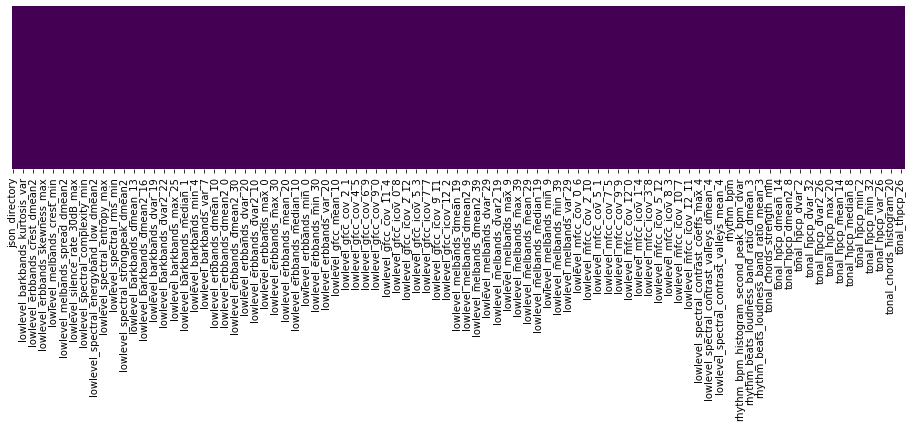

In [48]:
plt.figure(figsize=(16, 3))
sns.heatmap(df_full_tracks.isnull(), yticklabels=False, cbar=False, cmap='viridis')

There are no null values.

## Enumerate

###  check for non numerical values --> categorical data and explore this data

In [49]:
df_full_tracks.shape

(225, 2654)

In [50]:
df_full_tracks.select_dtypes(include=['object']).head()

,json_directory,track,danceability,tonal_chords_key,tonal_chords_scale,tonal_key_key,tonal_key_scale
0,Alternative,02 Happy Birthday - Altered Images.mp3,danceable,A,major,D,minor
1,Alternative,03 How Soon Is Now - Smiths.mp3,not_danceable,F#,major,F#,minor
2,Alternative,04 Pearly Dewdrops' Drops - Cocteau Twins.mp3,not_danceable,D,major,D,major
3,Alternative,06 Mr Brightside - Killers.mp3,danceable,C#,major,C#,major
4,Alternative,06 Song 2 - Blur.mp3,danceable,C,minor,G#,major


In [51]:
df_feats_tracks.select_dtypes(include=['object']).columns

Index(['tonal_chords_key', 'tonal_chords_scale', 'tonal_key_key',
       'tonal_key_scale'],
      dtype='object')

In [52]:
df_full_tracks['tonal_chords_key'].value_counts()

G     29
D     28
F     25
A     23
A#    21
E     20
C     20
C#    15
G#    14
D#    13
B      9
F#     8
Name: tonal_chords_key, dtype: int64

In [53]:
df_full_tracks['tonal_chords_scale'].value_counts()

major    125
minor    100
Name: tonal_chords_scale, dtype: int64

In [54]:
df_full_tracks['tonal_key_key'].value_counts()

F     30
A     28
D     28
C     27
D#    23
A#    21
G     18
E     14
C#    11
G#    10
F#     8
B      7
Name: tonal_key_key, dtype: int64

In [55]:
df_full_tracks['tonal_key_scale'].value_counts()

major    125
minor    100
Name: tonal_key_scale, dtype: int64

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f91ed6c54d0>,
      dtype=object)

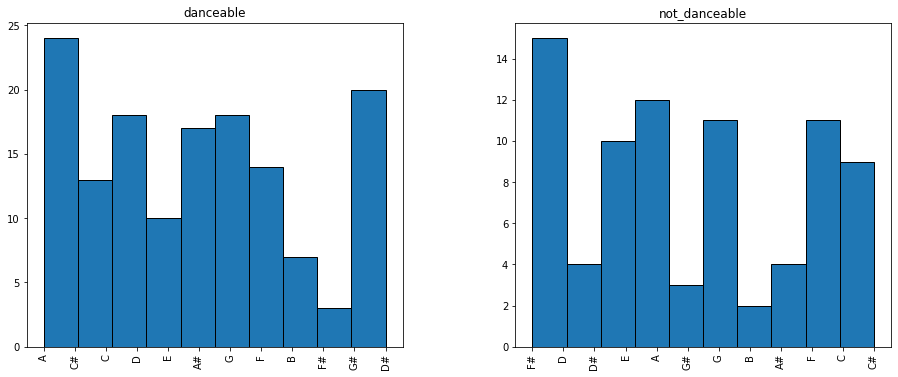

In [56]:
df_full_tracks.hist('tonal_chords_key', class_name, figsize=(15,6), edgecolor="k")


array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f91ed776150>,
      dtype=object)

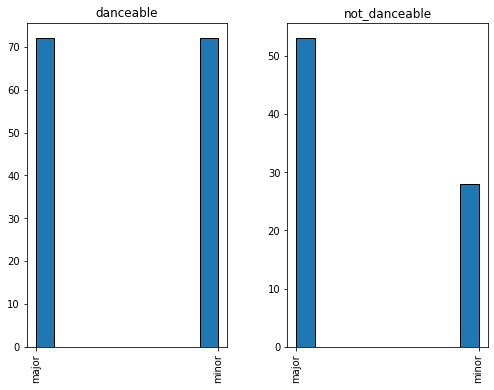

In [57]:
df_full_tracks.hist('tonal_chords_scale', class_name, figsize=(8,6), edgecolor="k")

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f91ed557090>,
      dtype=object)

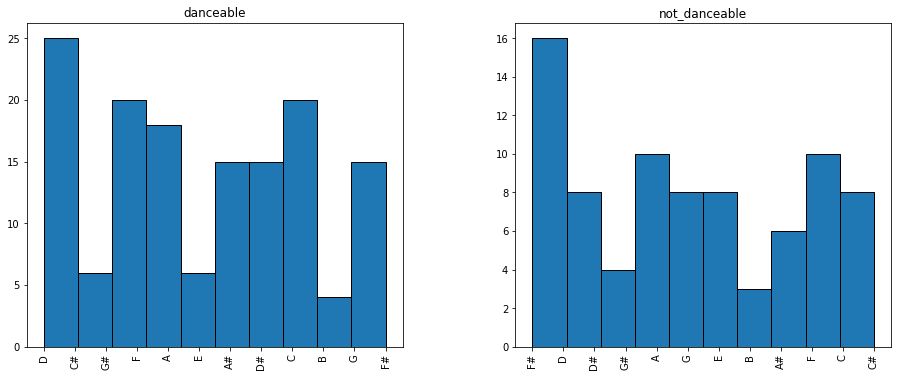

In [58]:
df_full_tracks.hist('tonal_key_key', class_name, figsize=(15,6), edgecolor="k")

array([<matplotlib.axes._subplots.AxesSubplot object at 0x7f91ee899110>,
      dtype=object)

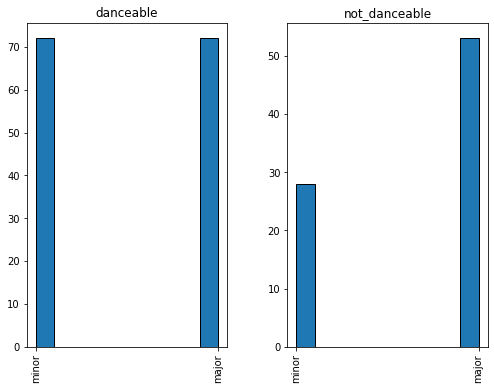

In [59]:
df_full_tracks.hist('tonal_key_scale', class_name, figsize=(8,6), edgecolor="k")

### One-hot encoding to categorical data

In [60]:
df_cat_full_tracks = df_full_tracks[['tonal_chords_key', 'tonal_chords_scale', 'tonal_key_key', 'tonal_key_scale']]

In [61]:
df_cat_full_tracks.head()

,tonal_chords_key,tonal_chords_scale,tonal_key_key,tonal_key_scale
0,A,major,D,minor
1,F#,major,F#,minor
2,D,major,D,major
3,C#,major,C#,major
4,C,minor,G#,major


In [62]:
df_cat_full_tracks_onehot = pd.get_dummies(df_cat_full_tracks)

In [63]:
df_cat_full_tracks_onehot.head()

,tonal_chords_key_A,tonal_chords_key_A#,tonal_chords_key_B,tonal_chords_key_C,tonal_chords_key_C#,tonal_chords_key_D,tonal_chords_key_D#,tonal_chords_key_E,tonal_chords_key_F,tonal_chords_key_F#,tonal_chords_key_G,tonal_chords_key_G#,tonal_chords_scale_major,tonal_chords_scale_minor,tonal_key_key_A,tonal_key_key_A#,tonal_key_key_B,tonal_key_key_C,tonal_key_key_C#,tonal_key_key_D,tonal_key_key_D#,tonal_key_key_E,tonal_key_key_F,tonal_key_key_F#,tonal_key_key_G,tonal_key_key_G#,tonal_key_scale_major,tonal_key_scale_minor
0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1
1,0,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
2,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0
3,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0
4,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,1,0


In [64]:
df_cat_full_tracks_onehot.columns

Index(['tonal_chords_key_A', 'tonal_chords_key_A#', 'tonal_chords_key_B',
       'tonal_chords_key_C', 'tonal_chords_key_C#', 'tonal_chords_key_D',
       'tonal_chords_key_D#', 'tonal_chords_key_E', 'tonal_chords_key_F',
       'tonal_chords_key_F#', 'tonal_chords_key_G', 'tonal_chords_key_G#',
       'tonal_chords_scale_major', 'tonal_chords_scale_minor',
       'tonal_key_key_A', 'tonal_key_key_A#', 'tonal_key_key_B',
       'tonal_key_key_C', 'tonal_key_key_C#', 'tonal_key_key_D',
       'tonal_key_key_D#', 'tonal_key_key_E', 'tonal_key_key_F',
       'tonal_key_key_F#', 'tonal_key_key_G', 'tonal_key_key_G#',
       'tonal_key_scale_major', 'tonal_key_scale_minor'],
      dtype='object')

In [65]:
len(list(df_cat_full_tracks_onehot.columns))

28

In [66]:
df_cat_full_tracks_onehot.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype
---  ------                    --------------  -----
 0   tonal_chords_key_A        225 non-null    uint8
 1   tonal_chords_key_A#       225 non-null    uint8
 2   tonal_chords_key_B        225 non-null    uint8
 3   tonal_chords_key_C        225 non-null    uint8
 4   tonal_chords_key_C#       225 non-null    uint8
 5   tonal_chords_key_D        225 non-null    uint8
 6   tonal_chords_key_D#       225 non-null    uint8
 7   tonal_chords_key_E        225 non-null    uint8
 8   tonal_chords_key_F        225 non-null    uint8
 9   tonal_chords_key_F#       225 non-null    uint8
 10  tonal_chords_key_G        225 non-null    uint8
 11  tonal_chords_key_G#       225 non-null    uint8
 12  tonal_chords_scale_major  225 non-null    uint8
 13  tonal_chords_scale_minor  225 non-null    uint8
 14  tonal_key_key_A           225 non-null    

In [67]:
df_full_tracks.drop(labels=['tonal_chords_key', 'tonal_chords_scale', 'tonal_key_key', 'tonal_key_scale'], 
                    axis=1, inplace=True)

In [68]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

In [69]:
df_full_tracks = pd.concat([df_full_tracks, df_cat_full_tracks_onehot], axis=1)

In [70]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

### Target class - Label encoding and OneHot Encoding

In [71]:
class_name

'danceability'

#### Target Label Encoding

In [72]:
df_full_tracks['{}_code'.format(class_name)] = df_full_tracks[class_name]

In [73]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

In [74]:
lb_make = LabelEncoder()

In [75]:
df_full_tracks['{}_code'.format(class_name)] = lb_make.fit_transform(df_full_tracks['{}_code'.format(class_name)])

In [76]:
df_full_tracks['{}_code'.format(class_name)].head()

0    0
1    1
2    1
3    0
4    0
Name: danceability_code, dtype: int64

In [77]:
lb_make.classes_

array(['danceable', 'not_danceable'], dtype=object)

In [78]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

#### Target Class - One Hot Encoding

Can be used in Neural Networks, and some sklearn algorithms

In [79]:
df_target_onehot = pd.get_dummies(df_full_tracks[class_name], prefix='oh_{}'.format(class_name), prefix_sep='_')

In [80]:
df_target_onehot.head()

,oh_danceability_danceable,oh_danceability_not_danceable
0,1,0
1,0,1
2,0,1
3,1,0
4,1,0


In [81]:
df_full_tracks = pd.concat([df_full_tracks, df_target_onehot], axis=1)

In [82]:
df_full_tracks.head()

json_directory                                          track  \
0    Alternative         02 Happy Birthday - Altered Images.mp3   
1    Alternative                03 How Soon Is Now - Smiths.mp3   
2    Alternative  04 Pearly Dewdrops' Drops - Cocteau Twins.mp3   
3    Alternative                 06 Mr Brightside - Killers.mp3   
4    Alternative                           06 Song 2 - Blur.mp3   

    danceability  lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0      danceable                   0.940232                        2.766660   
1  not_danceable                   0.918468                        2.675291   
2  not_danceable                   0.903639                        2.680212   
3      danceable                   0.964146                        2.334805   
4      danceable                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.1268

In [83]:
df_full_tracks.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 225 entries, 0 to 224
Columns: 2681 entries, json_directory to oh_danceability_not_danceable
dtypes: float64(2573), int64(75), object(3), uint8(30)
memory usage: 4.6+ MB


# Preprocessing

## Selecting the kind of learning and taking the corresponding features + Cleaning

In [84]:
# train kind: svm, deep_learning, supervised
train_kind = 'svm'

In [85]:
if train_kind is 'svm':
    df_tracks_ml = df_full_tracks.drop(labels=['json_directory', 'track', 
                                               'danceability_code', 
                                               'oh_danceability_danceable', 
                                               'oh_danceability_not_danceable'], axis=1)

**X data**

In [86]:
X = df_tracks_ml.drop(labels=[class_name], axis=1)

In [87]:
X.shape

(225, 2675)

**y data**

In [88]:
y = df_tracks_ml[class_name]

In [89]:
X.head()

lowlevel_average_loudness  lowlevel_barkbands_crest_dmean  \
0                   0.940232                        2.766660   
1                   0.918468                        2.675291   
2                   0.903639                        2.680212   
3                   0.964146                        2.334805   
4                   0.923212                        2.654776   

   lowlevel_barkbands_crest_dmean2  lowlevel_barkbands_crest_dvar  \
0                         4.448297                       5.745806   
1                         4.377324                       6.211648   
2                         4.377909                       5.717108   
3                         3.876004                       6.314280   
4                         4.302909                       6.634628   

   lowlevel_barkbands_crest_dvar2  lowlevel_barkbands_crest_max  \
0                       14.987641                     26.722847   
1                       15.621523                     26.676046   
2                       13.717224                     24.490746   
3                       16.660341                     24.082594   
4                       16.935333                     26.224245   

   lowlevel_barkbands_crest_mean  lowlevel_barkbands_crest_median  \
0                      10.807129                         9.691339   
1                       8.789837                         8.108212   
2                       8.958855                         8.116771   
3                       7.989666                         7.193906   
4                       9.249996                         8.158960   

   lowlevel_barkbands_crest_min  lowlevel_barkbands_crest_var  \
0                      2.798266                     24.122204   
1                      2.419000                     12.385103   
2                      2.538304                     14.455623   
3                      2.510511                     11.031219   
4                      2.489789                     18.725180   

   lowlevel_barkbands_flatness_db_dmean  \
0                              0.023720   
1                              0.021670   
2                              0.020029   
3                              0.017094   
4                              0.020814   

   lowlevel_barkbands_flatness_db_dmean2  lowlevel_barkbands_flatness_db_dvar  \
0                               0.035958                             0.000526   
1                               0.033876                             0.000391   
2                               0.032708                             0.000378   
3                               0.027388                             0.000365   
4                               0.032149                             0.000563   

   lowlevel_barkbands_flatness_db_dvar2  lowlevel_barkbands_flatness_db_max  \
0                              0.001158                            0.627938   
1                              0.000961                            0.448718   
2                              0.000948                            0.291119   
3                              0.000918                            0.561661   
4                              0.001232                            0.386401   

   lowlevel_barkbands_flatness_db_mean  lowlevel_barkbands_flatness_db_median  \
0                             0.176747                               0.146083   
1                             0.113029                               0.105044   
2                             0.126804                               0.123771   
3                             0.096527                               0.074531   
4                             0.115602                               0.095726   

   lowlevel_barkbands_flatness_db_min  lowlevel_barkbands_flatness_db_var  \
0                            0.040839                            0.010974   
1                            0.025457                            0.001940   
2                            0.045240                  

In [90]:
# check the dtypes if are all OK
# X.dtypes

In [91]:
type(y)

pandas.core.series.Series

## Scaling

### Scaling the data

In [92]:
scaler = StandardScaler()

In [93]:
scaler.fit(X)

StandardScaler(copy=True, with_mean=True, with_std=True)

In [94]:
X_norm = scaler.transform(X)

In [95]:
X_norm

array([[ 0.6284611 , -0.30687451, -0.21902026, ..., -0.21566555,
        -1.11803399,  1.11803399],
       [ 0.54150004, -0.48057098, -0.30306602, ..., -0.21566555,
        -1.11803399,  1.11803399],
       [ 0.48225165, -0.47121687, -0.30237317, ..., -0.21566555,
         0.89442719, -0.89442719],
       ...,
       [-2.88465221, -0.35621679, -0.37293917, ..., -0.21566555,
         0.89442719, -0.89442719],
       [ 0.45241942, -0.56181505, -0.57801024, ..., -0.21566555,
        -1.11803399,  1.11803399],
       [-1.03276425, -0.61696614, -0.64636613, ..., -0.21566555,
        -1.11803399,  1.11803399]])

### Save the scaler model locally

In [96]:
# save the scaler
scaler_filename = 'scaler.pkl'
pickle.dump(scaler, open(scaler_filename, 'wb'))

### Load the scaler and test if it works fine on the same data

In [97]:
# load the scaler
scaler_new = pickle.load(open(scaler_filename, 'rb'))

In [98]:
X_norm_from_loaded_scaler = scaler_new.transform(X)

In [99]:
X_norm_from_loaded_scaler

array([[ 0.6284611 , -0.30687451, -0.21902026, ..., -0.21566555,
        -1.11803399,  1.11803399],
       [ 0.54150004, -0.48057098, -0.30306602, ..., -0.21566555,
        -1.11803399,  1.11803399],
       [ 0.48225165, -0.47121687, -0.30237317, ..., -0.21566555,
         0.89442719, -0.89442719],
       ...,
       [-2.88465221, -0.35621679, -0.37293917, ..., -0.21566555,
         0.89442719, -0.89442719],
       [ 0.45241942, -0.56181505, -0.57801024, ..., -0.21566555,
        -1.11803399,  1.11803399],
       [-1.03276425, -0.61696614, -0.64636613, ..., -0.21566555,
        -1.11803399,  1.11803399]])

## PCA-95

### Apply PCA to the data

In [100]:
pca = PCA(n_components=.95)

In [101]:
pca.fit(X_norm)

PCA(copy=True, iterated_power='auto', n_components=0.95, random_state=None,
    svd_solver='auto', tol=0.0, whiten=False)

In [102]:
X_pca = pca.transform(X_norm)

In [103]:
X_pca

array([[  6.76209704, -10.49134317,  -4.07373408, ...,  -0.06685304,
          2.17574526,   1.0414631 ],
       [ -0.45101817, -13.56006175,  12.40051172, ...,   1.93451344,
         -2.71647544,   0.7213484 ],
       [  4.04978249, -33.42037219,  15.65326558, ...,   0.20097504,
         -0.26575512,  -2.99868128],
       ...,
       [ 46.98902414,  35.60815786,  21.24537383, ...,  -0.28742366,
         -1.6504424 ,   2.00863663],
       [ 13.00649866,  -1.82278026, -10.65766607, ...,  -1.35268229,
         -0.94555153,   0.13623192],
       [ 17.70995063,  23.78082441, -21.83227098, ...,  -0.3390996 ,
          0.67503552,   0.40172947]])

#### Explained Variance:

The amount of variance explained by each of the selected components. Equal to n_components largest eigenvalues of the covariance matrix of X.

In [104]:
pca.explained_variance_

array([384.00466484, 209.10580185, 153.18956872, 129.0443246 ,
        97.90961097,  81.60912601,  73.3727208 ,  66.91884632,
        58.98569499,  49.94182122,  41.79271695,  41.05249255,
        37.18926955,  35.22027543,  32.54277095,  31.8360066 ,
        29.39543532,  28.16360169,  26.74949068,  25.88816549,
        24.86427661,  24.639918  ,  23.95519768,  22.78005865,
        21.55031269,  21.20263134,  20.95109801,  20.09589073,
        19.02922829,  18.16891818,  17.94307256,  17.27627862,
        16.58613453,  16.5089236 ,  15.52836592,  14.83866879,
        13.97415874,  13.7440884 ,  13.38661015,  13.2234211 ,
        12.70900738,  12.44597296,  12.34505574,  12.04766475,
        11.87816092,  11.24907784,  10.86026026,  10.45286423,
        10.27256031,   9.91117044,   9.79211887,   9.60989346,
         9.56599159,   9.42410075,   8.96502635,   8.77169338,
         8.66935391,   8.26595293,   8.11661164,   7.98506895,
         7.9459195 ,   7.68180448,   7.43716259,   7.26

In [105]:
len(pca.explained_variance_)

122

#### Explained Variance Ratio:

Shows how each of the components covers the in % the variance of the whole dataset. Here the components that are extracted by the algorithm cover the 95% of the dataset's variance.

In [106]:
pca.explained_variance_ratio_

array([0.14613837, 0.07957815, 0.05829844, 0.04910963, 0.03726088,
       0.0310575 , 0.02792302, 0.02546691, 0.02244783, 0.01900606,
       0.01590481, 0.0156231 , 0.0141529 , 0.01340357, 0.01238461,
       0.01211564, 0.01118685, 0.01071805, 0.01017989, 0.00985211,
       0.00946245, 0.00937707, 0.00911649, 0.00866927, 0.00820127,
       0.00806896, 0.00797323, 0.00764777, 0.00724184, 0.00691444,
       0.00682849, 0.00657473, 0.00631209, 0.0062827 , 0.00590954,
       0.00564706, 0.00531806, 0.00523051, 0.00509446, 0.00503236,
       0.00483659, 0.00473649, 0.00469808, 0.00458491, 0.0045204 ,
       0.00428099, 0.00413302, 0.00397798, 0.00390937, 0.00377184,
       0.00372653, 0.00365718, 0.00364047, 0.00358647, 0.00341177,
       0.00333819, 0.00329924, 0.00314572, 0.00308889, 0.00303883,
       0.00302393, 0.00292342, 0.00283032, 0.00276309, 0.00271159,
       0.00267941, 0.0026681 , 0.00261107, 0.00253783, 0.00247442,
       0.00244835, 0.00242862, 0.00233432, 0.0023016 , 0.00224

In [107]:
len(pca.explained_variance_ratio_)

122

In [108]:
pca.singular_values_

array([293.28662589, 216.42481284, 185.24163515, 170.01743649,
       148.09372997, 135.20519304, 128.20097292, 122.43292685,
       114.94692548, 105.76846388,  96.75519933,  95.89451669,
        91.27100514,  88.82196629,  85.3790413 ,  84.44682042,
        81.14540968,  79.42699024,  77.40727299,  76.15083105,
        74.62973911,  74.29227168,  73.25274248,  71.43341751,
        69.47855814,  68.91581401,  68.50580965,  67.09306613,
        65.28818528,  63.79527939,  63.39754138,  62.20841109,
        60.95321267,  60.81117404,  58.97757172,  57.65294276,
        55.9482936 ,  55.48581621,  54.75948021,  54.42468491,
        53.35557754,  52.80054871,  52.5860484 ,  51.94879116,
        51.58205158,  50.19754412,  49.32239146,  48.38844478,
        47.96929756,  47.11796025,  46.8341182 ,  46.39629442,
        46.29019461,  45.94560445,  44.81256412,  44.32673366,
        44.06739469,  43.02991351,  42.63943021,  42.29249869,
        42.18869478,  41.48161284,  40.8157374 ,  40.32

In [109]:
len(pca.singular_values_)

122

### Save the PCA transformer model locally

In [110]:
pca_filename = 'pca_transformer.pkl'
pickle.dump(pca, open(pca_filename,"wb"))

### Load the PCA transformer and test if it works fine on the same data

In [111]:
pca_loaded = pickle.load(open(pca_filename,'rb'))
X_pca_from_loaded_tranformer = pca_loaded.transform(X_norm)

In [112]:
X_pca_from_loaded_tranformer

array([[  6.76209704, -10.49134317,  -4.07373408, ...,  -0.06685304,
          2.17574526,   1.0414631 ],
       [ -0.45101817, -13.56006175,  12.40051172, ...,   1.93451344,
         -2.71647544,   0.7213484 ],
       [  4.04978249, -33.42037219,  15.65326558, ...,   0.20097504,
         -0.26575512,  -2.99868128],
       ...,
       [ 46.98902414,  35.60815786,  21.24537383, ...,  -0.28742366,
         -1.6504424 ,   2.00863663],
       [ 13.00649866,  -1.82278026, -10.65766607, ...,  -1.35268229,
         -0.94555153,   0.13623192],
       [ 17.70995063,  23.78082441, -21.83227098, ...,  -0.3390996 ,
          0.67503552,   0.40172947]])

# Machine Learning

In [113]:
from sklearn.model_selection import train_test_split
from sklearn import datasets
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score

## Train/Test split

With the train/test split method the data is shuffled before the splitting process.

In [114]:
X_train, X_test, y_train, y_test = train_test_split(X_norm, y, test_size=0.33, random_state=42)

In [115]:
X_train_pca, X_test_pca, y_train, y_test = train_test_split(X_pca, y, test_size=0.33, random_state=42)

#### y_train

In [116]:
y_train.value_counts()

danceable        97
not_danceable    53
Name: danceability, dtype: int64

In [117]:
y_train.value_counts(normalize=True)

danceable        0.646667
not_danceable    0.353333
Name: danceability, dtype: float64

In [118]:
y_train.head()

223    not_danceable
31         danceable
12     not_danceable
35         danceable
28     not_danceable
Name: danceability, dtype: object

#### y_test

In [119]:
y_test.value_counts()

danceable        47
not_danceable    28
Name: danceability, dtype: int64

In [120]:
y_test.value_counts(normalize=True)

danceable        0.626667
not_danceable    0.373333
Name: danceability, dtype: float64

In [121]:
y_test.head()

9      not_danceable
184    not_danceable
120        danceable
207        danceable
148    not_danceable
Name: danceability, dtype: object

#### y data

In [122]:
y.value_counts()

danceable        144
not_danceable     81
Name: danceability, dtype: int64

In [123]:
y.value_counts(normalize=True)

danceable        0.64
not_danceable    0.36
Name: danceability, dtype: float64

In [124]:
y.head()

0        danceable
1    not_danceable
2    not_danceable
3        danceable
4        danceable
Name: danceability, dtype: object

## Cross Validation

### Initialize a simple classifier

In [125]:
clf = SVC(kernel='rbf', C=1)

### CV with X normalized

In [126]:
scores = cross_val_score(clf, X_norm, y, cv=5)

In [127]:
print("Accuracy of danceability: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy of danceability: 0.86 (+/- 0.21)


### CV with X after PCA

In [128]:
scores = cross_val_score(clf, X_pca, y, cv=5)

In [129]:
print("Accuracy of danceability: %0.2f (+/- %0.2f)" % (scores.mean(), scores.std() * 2))

Accuracy of danceability: 0.85 (+/- 0.24)


## Initialize grid parameters

In [130]:
# define the length of parameters
parameters_grid = {'kernel': ['poly', 'rbf'], 
                   'C': [0.1, 1, 10, 100, 3, 5, 7, 9, 11 ], 
                   'gamma': [1, 0.1, 0.01, 0.001, 3, 5, 7, 9, 11], 
                   'class_weight':['balanced', None]
                  }

## Evaluation function

In [131]:
def evaluation(model, X_data, y_data, model_name):
    """A function to compute the evaluation based on 
    Parameters:
    model: the model to run predictions
    X_data (numpy array): the test data to provide predictions from
    y_data (pd.Series or numpy array): the labels data
    model_name (str): The name of the model that will be evaluated
    
    """
    print('Model to evaluate:', model_name)
    print('X_data shape:', X_data.shape)
    print('y_data shape:', y_data.shape)
    print('Model classes:', model.classes_)
    print()
    
    # predictions
    print('PREDICTIONS - {}'.format(model_name))
    predictions = model.predict(X_data)
    print('{} - Confusion matrix:'.format(model_name))
    print(confusion_matrix(y_data, predictions))
    cm = confusion_matrix(y_data, predictions)
    print('Type of CM:', type(cm))            
    print()
    print('Classification Report:')
    print(classification_report(y_data, predictions))
    print()
    
    print('PROBABILITIES - {}'.format(model_name))
    # probabilities for each predicition
    prob_predictions = model.predict_proba(X_data)
    prob_predictions = prob_predictions * 100  # multiply * 100 for better resutls
    # df_prob_gsvc_pca_test.drop(df.index, inplace=True)  # if DF exists, empty it
    df_prob_predictions = pd.DataFrame(prob_predictions)
    print('Head of the predictions probabilities DF:')
    print(df_prob_predictions.head())
    print()
    # tranform the predictions and the test data for the 
    # DF concatenation with the probabilities DF
    series_predictions = pd.Series(predictions)
    y_data_reindexed = y_data.reset_index(drop=True)
    print('Type of the re-indexed y_data:', type(y_data_reindexed))
    print()
    # concatenate
    df_prob_predictions = pd.concat([df_prob_predictions, series_predictions, y_data_reindexed], 
                                    axis=1, ignore_index=False)
    
    df_prob_predictions.columns = ['prob_pred_dance', 'prob_pred_not_dance', 'prediction', 'true']
    print('Final DF:')
    print(df_prob_predictions.head())
    print()
    
    print('MEAN ACCURACIES IN THE PROBABILITIES PREDICTIONS - {}'.format(model_name))
    tp_values = []
    tn_values = []
    fp_values = []
    fn_values = []

    for index, row in df_prob_predictions.iterrows():
        if row['true'] == row['prediction']:
            if row['prediction'] == 'danceable':
                tp_values.append(row['prob_pred_dance'])
            elif row['prediction'] == 'not_danceable':
                tn_values.append(row['prob_pred_not_dance'])
        if row['true'] != row['prediction']:
            if row['prediction'] == 'danceable':
                fn_values.append(row['prob_pred_dance'])
            elif row['prediction'] == 'not_danceable':
                fp_values.append(row['prob_pred_not_dance'])
                
    # TP
    if len(tp_values) is 0:
        tp_mean = 0.0
    else:
        tp_mean = sum(tp_values) / len(tp_values)
    print('TP mean:', tp_mean)
    # FP
    if len(fp_values) is 0:
        fp_mean = 0.0
    else:
        fp_mean = sum(fp_values) / len(fp_values)
    print('FP mean:', fp_mean)
    # TN
    if len(tn_values) is 0:
        tn_mean = 0.0
    else:
        tn_mean = sum(tn_values) / len(tn_values)
    print('TN mean:', tn_mean)
    # FN
    if len(fn_values) is 0:
        fn_mean = 0.0
    else:
        fn_mean = sum(fn_values) / len(fn_values)
    print('FN mean:', fn_mean) 

## GridSearch with CV in X normalized

### GridSearch model with X normalized

In [132]:
svm = SVC(gamma='auto', probability=True)

In [133]:
gsvc = GridSearchCV(estimator=svm, param_grid=parameters_grid, cv=5)

In [134]:
X_norm.shape

(225, 2675)

In [135]:
gsvc.fit(X_norm, y)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto', kernel='rbf', max_iter=-1,
                           probability=True, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 3, 5, 7, 9, 11],
                         'class_weight': ['balanced', None],
                         'gamma': [1, 0.1, 0.01, 0.001, 3, 5, 7, 9, 11],
                         'kernel': ['poly', 'rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [136]:
gsvc.best_score_

0.8355555555555554

In [137]:
gsvc.best_estimator_

SVC(C=0.1, break_ties=False, cache_size=200, class_weight='balanced', coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=1, kernel='poly',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [138]:
gsvc.best_params_

{'C': 0.1, 'class_weight': 'balanced', 'gamma': 1, 'kernel': 'poly'}

In [139]:
# save the model to disk
filename_model_norm = 'model_gsvc_normalized.pkl'
pickle.dump(gsvc, open(filename_model_norm, 'wb'))

### Evaluation on Test data

In [140]:
# predictions = gsvc.predict(X_test)
# print('Confusion matrix:')
# print(confusion_matrix(y_test, predictions))
# cm = confusion_matrix(y_test, predictions)
# print('Type of CM:', type(cm))
# for item in cm:
#     n_items = sum(item)
#     np.array(item) *   

In [141]:
evaluation(gsvc, X_data=X_test, y_data=y_test, model_name='GridSearch SVM in X_test normalized')

Model to evaluate: GridSearch SVM in X_test normalized
X_data shape: (75, 2675)
y_data shape: (75,)
Model classes: ['danceable' 'not_danceable']

PREDICTIONS - GridSearch SVM in X_test normalized
GridSearch SVM in X_test normalized - Confusion matrix:
[[47  0]
 [ 0 28]]
Type of CM: <class 'numpy.ndarray'>

Classification Report:
               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00        47
not_danceable       1.00      1.00      1.00        28

     accuracy                           1.00        75
    macro avg       1.00      1.00      1.00        75
 weighted avg       1.00      1.00      1.00        75


PROBABILITIES - GridSearch SVM in X_test normalized
Head of the predictions probabilities DF:
           0          1
0   0.000292  99.999708
1   0.000292  99.999708
2  98.882389   1.117611
3  99.996911   0.003089
4   0.000293  99.999707

Type of the re-indexed y_data: <class 'pandas.core.series.Series'>

Final DF:
   prob_pred_dance

### Evaluation on Train data

In [142]:
evaluation(gsvc, X_data=X_train, y_data=y_train, model_name='GridSearch SVM in X_train normalized')

Model to evaluate: GridSearch SVM in X_train normalized
X_data shape: (150, 2675)
y_data shape: (150,)
Model classes: ['danceable' 'not_danceable']

PREDICTIONS - GridSearch SVM in X_train normalized
GridSearch SVM in X_train normalized - Confusion matrix:
[[97  0]
 [ 0 53]]
Type of CM: <class 'numpy.ndarray'>

Classification Report:
               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00        97
not_danceable       1.00      1.00      1.00        53

     accuracy                           1.00       150
    macro avg       1.00      1.00      1.00       150
 weighted avg       1.00      1.00      1.00       150


PROBABILITIES - GridSearch SVM in X_train normalized
Head of the predictions probabilities DF:
           0          1
0   0.000292  99.999708
1  98.882948   1.117052
2   0.000293  99.999707
3  98.882889   1.117111
4   0.000292  99.999708

Type of the re-indexed y_data: <class 'pandas.core.series.Series'>

Final DF:
   prob_pred

### Evaluation on whole dataset

In [143]:
evaluation(gsvc, X_data=X_norm, y_data=y, model_name='GridSearch SVM in X whole dataset normalized')

Model to evaluate: GridSearch SVM in X whole dataset normalized
X_data shape: (225, 2675)
y_data shape: (225,)
Model classes: ['danceable' 'not_danceable']

PREDICTIONS - GridSearch SVM in X whole dataset normalized
GridSearch SVM in X whole dataset normalized - Confusion matrix:
[[144   0]
 [  0  81]]
Type of CM: <class 'numpy.ndarray'>

Classification Report:
               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00       144
not_danceable       1.00      1.00      1.00        81

     accuracy                           1.00       225
    macro avg       1.00      1.00      1.00       225
 weighted avg       1.00      1.00      1.00       225


PROBABILITIES - GridSearch SVM in X whole dataset normalized
Head of the predictions probabilities DF:
           0          1
0  98.883622   1.116378
1   0.000292  99.999708
2   0.000291  99.999709
3  98.881865   1.118135
4  98.881534   1.118466

Type of the re-indexed y_data: <class 'pandas.core.ser

## GridSearch CV with X after PCA

### GridSearch model with X PCA

In [144]:
gsvc_pca = GridSearchCV(estimator=svm, param_grid=parameters_grid, cv=5)

In [145]:
X_pca.shape

(225, 122)

In [146]:
gsvc_pca.fit(X_pca, y)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='auto', kernel='rbf', max_iter=-1,
                           probability=True, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 3, 5, 7, 9, 11],
                         'class_weight': ['balanced', None],
                         'gamma': [1, 0.1, 0.01, 0.001, 3, 5, 7, 9, 11],
                         'kernel': ['poly', 'rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [147]:
gsvc_pca.best_score_

0.8711111111111111

In [148]:
gsvc_pca.best_estimator_

SVC(C=1, break_ties=False, cache_size=200, class_weight='balanced', coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma=0.001, kernel='poly',
    max_iter=-1, probability=True, random_state=None, shrinking=True, tol=0.001,
    verbose=False)

In [149]:
gsvc_pca.best_params_

{'C': 1, 'class_weight': 'balanced', 'gamma': 0.001, 'kernel': 'poly'}

In [150]:
# save the model to disk
filename_model_pca = 'model_gsvc_pca.pkl'
pickle.dump(gsvc_pca, open(filename_model_pca, 'wb'))

### PCA - Evaluation on Test data

In [151]:
evaluation(gsvc_pca, X_data=X_test_pca, y_data=y_test, model_name='GridSearch SVM in X_test data with PCA')

Model to evaluate: GridSearch SVM in X_test data with PCA
X_data shape: (75, 122)
y_data shape: (75,)
Model classes: ['danceable' 'not_danceable']

PREDICTIONS - GridSearch SVM in X_test data with PCA
GridSearch SVM in X_test data with PCA - Confusion matrix:
[[47  0]
 [ 0 28]]
Type of CM: <class 'numpy.ndarray'>

Classification Report:
               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00        47
not_danceable       1.00      1.00      1.00        28

     accuracy                           1.00        75
    macro avg       1.00      1.00      1.00        75
 weighted avg       1.00      1.00      1.00        75


PROBABILITIES - GridSearch SVM in X_test data with PCA
Head of the predictions probabilities DF:
           0          1
0   0.801025  99.198975
1   0.803246  99.196754
2  98.308552   1.691448
3  99.994533   0.005467
4   0.803054  99.196946

Type of the re-indexed y_data: <class 'pandas.core.series.Series'>

Final DF:
   prob

### PCA - Evaluation on Train data

In [152]:
evaluation(gsvc_pca, X_data=X_train_pca, y_data=y_train, model_name='GridSearch SVM in X_train data with PCA')

Model to evaluate: GridSearch SVM in X_train data with PCA
X_data shape: (150, 122)
y_data shape: (150,)
Model classes: ['danceable' 'not_danceable']

PREDICTIONS - GridSearch SVM in X_train data with PCA
GridSearch SVM in X_train data with PCA - Confusion matrix:
[[97  0]
 [ 0 53]]
Type of CM: <class 'numpy.ndarray'>

Classification Report:
               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00        97
not_danceable       1.00      1.00      1.00        53

     accuracy                           1.00       150
    macro avg       1.00      1.00      1.00       150
 weighted avg       1.00      1.00      1.00       150


PROBABILITIES - GridSearch SVM in X_train data with PCA
Head of the predictions probabilities DF:
           0          1
0   0.803098  99.196902
1  98.309999   1.690001
2   0.802922  99.197078
3  98.311635   1.688365
4   0.803243  99.196757

Type of the re-indexed y_data: <class 'pandas.core.series.Series'>

Final DF:
 

### PCA - Evaluation on the whole dataset

In [153]:
evaluation(gsvc_pca, X_data=X_pca, y_data=y, model_name='GridSearch SVM in X whole dataset with PCA')

Model to evaluate: GridSearch SVM in X whole dataset with PCA
X_data shape: (225, 122)
y_data shape: (225,)
Model classes: ['danceable' 'not_danceable']

PREDICTIONS - GridSearch SVM in X whole dataset with PCA
GridSearch SVM in X whole dataset with PCA - Confusion matrix:
[[144   0]
 [  0  81]]
Type of CM: <class 'numpy.ndarray'>

Classification Report:
               precision    recall  f1-score   support

    danceable       1.00      1.00      1.00       144
not_danceable       1.00      1.00      1.00        81

     accuracy                           1.00       225
    macro avg       1.00      1.00      1.00       225
 weighted avg       1.00      1.00      1.00       225


PROBABILITIES - GridSearch SVM in X whole dataset with PCA
Head of the predictions probabilities DF:
           0          1
0  98.308732   1.691268
1   0.803106  99.196894
2   0.803675  99.196325
3  98.312371   1.687629
4  98.310440   1.689560

Type of the re-indexed y_data: <class 'pandas.core.series.Serie

## Test random data if the model works well on predictions

In [154]:
y_train.iloc[0:25]

223    not_danceable
31         danceable
12     not_danceable
35         danceable
28     not_danceable
42         danceable
125        danceable
113        danceable
153    not_danceable
51         danceable
181    not_danceable
180    not_danceable
76         danceable
41         danceable
95         danceable
138        danceable
78         danceable
156        danceable
26     not_danceable
205        danceable
189    not_danceable
126        danceable
0          danceable
2      not_danceable
77         danceable
Name: danceability, dtype: object

### GSVC

In [155]:
gsvc.predict(X_train[20].reshape(1, -1))

array(['not_danceable'], dtype=object)

In [156]:
y_train.iloc[20]

'not_danceable'

In [157]:
gsvc.predict(X_train[10].reshape(1, -1))

array(['not_danceable'], dtype=object)

In [158]:
y_train.iloc[10]

'not_danceable'

In [159]:
gsvc.predict(X_train[1].reshape(1, -1))

array(['danceable'], dtype=object)

In [160]:
y_train.iloc[1]

'danceable'

In [161]:
# load the model from disk
loaded_model_norm = pickle.load(open(filename_model_norm, 'rb'))

In [162]:
loaded_model_norm.predict(X_train[5].reshape(1, -1))

array(['danceable'], dtype=object)

In [163]:
y_train.iloc[5]

'danceable'

### GSVC - PCA

In [164]:
gsvc_pca.predict(X_train_pca[20].reshape(1, -1))

array(['not_danceable'], dtype=object)

In [165]:
y_train.iloc[20]

'not_danceable'

In [166]:
gsvc_pca.predict(X_train_pca[10].reshape(1, -1))

array(['not_danceable'], dtype=object)

In [167]:
y_train.iloc[10]

'not_danceable'

In [168]:
gsvc_pca.predict(X_train_pca[1].reshape(1, -1))

array(['danceable'], dtype=object)

In [169]:
y_train.iloc[1]

'danceable'

Load the model

In [170]:
# load the model from disk
loaded_model_pca = pickle.load(open(filename_model_pca, 'rb'))

In [171]:
loaded_model_pca.predict(X_train_pca[5].reshape(1, -1))

array(['danceable'], dtype=object)

In [172]:
y_train.iloc[5]

'danceable'

## TEST for automatic mean export of correct predictions- gsvc_pca - X_test_pca

In [173]:
pred_prob = gsvc_pca.predict_proba(X_test_pca)

In [174]:
type(pred_prob)

numpy.ndarray

In [175]:
pred_prob[:3]

array([[0.00801025, 0.99198975],
       [0.00803246, 0.99196754],
       [0.98308552, 0.01691448]])

In [176]:
pred_prob = pred_prob * 100

In [177]:
pred_prob[:3]

array([[ 0.80102511, 99.19897489],
       [ 0.80324638, 99.19675362],
       [98.30855222,  1.69144778]])

In [178]:
pred = gsvc_pca.predict(X_test_pca)

In [179]:
type(pred)

numpy.ndarray

In [180]:
df_pred_prob = pd.DataFrame(data=pred_prob)

In [181]:
df_pred_prob.head()

,0,1
0,0.801025,99.198975
1,0.803246,99.196754
2,98.308552,1.691448
3,99.994533,0.005467
4,0.803054,99.196946


In [182]:
df_pred_prob.shape

(75, 2)

In [183]:
df_pred = pd.DataFrame(data=pred)

In [184]:
df_pred.head()

,0
0,not_danceable
1,not_danceable
2,danceable
3,danceable
4,not_danceable


In [185]:
df_pred.shape

(75, 1)

In [186]:
y_test.shape

(75,)

In [187]:
type(y_test)

pandas.core.series.Series

In [188]:
y_test.head()

9      not_danceable
184    not_danceable
120        danceable
207        danceable
148    not_danceable
Name: danceability, dtype: object

In [189]:
y_test_reindexed = y_test.reset_index(drop=True)

In [190]:
y_test_reindexed.head()

0    not_danceable
1    not_danceable
2        danceable
3        danceable
4    not_danceable
Name: danceability, dtype: object

In [191]:
# concatenate
df_pred_general = pd.concat([df_pred_prob, df_pred, y_test_reindexed], axis=1, ignore_index=False)

In [192]:
df_pred_general.head()

,0,1,0,danceability
0,0.801025,99.198975,not_danceable,not_danceable
1,0.803246,99.196754,not_danceable,not_danceable
2,98.308552,1.691448,danceable,danceable
3,99.994533,0.005467,danceable,danceable
4,0.803054,99.196946,not_danceable,not_danceable


In [193]:
df_pred_general.shape

(75, 4)

In [194]:
gsvc_pca.classes_

array(['danceable', 'not_danceable'], dtype=object)

In [195]:
df_class_columns = []

In [196]:
df_class_columns.clear()

In [197]:
for item in gsvc_pca.classes_:
    df_class_columns.append(item)

In [198]:
df_class_columns.append('predicted')
df_class_columns.append('true')

In [199]:
df_class_columns

['danceable', 'not_danceable', 'predicted', 'true']

In [200]:
df_pred_general.columns = df_class_columns

In [201]:
df_pred_general.head()

,danceable,not_danceable,predicted,true
0,0.801025,99.198975,not_danceable,not_danceable
1,0.803246,99.196754,not_danceable,not_danceable
2,98.308552,1.691448,danceable,danceable
3,99.994533,0.005467,danceable,danceable
4,0.803054,99.196946,not_danceable,not_danceable


In [202]:
for item in gsvc_pca.classes_:
    pred_mean_truth_pred = []
    for index, row in df_pred_general.iterrows():
        if row['true'] == row['predicted']:
            if row['predicted'] == item:
                pred_mean_truth_pred.append(row[item])
    print('{} - length of list:'.format(item), len(pred_mean_truth_pred))
    if len(pred_mean_truth_pred) is 0:
        print('{} - Mean:'.format(item), 0.0)
    else:
        print('{} - Mean:'.format(item), sum(pred_mean_truth_pred) / len(pred_mean_truth_pred))
    print()

danceable - length of list: 47
danceable - Mean: 98.64447950711237

not_danceable - length of list: 28
not_danceable - Mean: 99.45607268443305

